## Programação não Linear II - 2018.2
### Segundo Trabalho de Processamento de Imagens

Professora: Luziane F. de Mendonça

Alunos: Estevan Gladstone do N. Melo e Gabriel dos Santos Vieira

### Módulos

Primeiro são feitas as importações dos módulos e bibliotecas que serão utilizados nos experimentos a seguir. Dentre os módulos, destacamos o cv2, biblioteca python do openCV para manipulação de imagens. Ela possui implementações eficientes e uma boa documentação, não apenas quanto à programação, mas também apoio teórico.

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import math
import requests
from skimage.transform import probabilistic_hough_line

%matplotlib inline

### Detecção de Contorno

Para detecção de bordas em imagens foram utilizados os filtros de Robert, Sobel e Laplaciano. Partindo das experiências no primeiro trabalho, foram aplicadas pequenas alterações nos filtros com o propósito de obter um melhor resultado no conjunto das etapas.

No caso do filtro de Robert, foram utilizadas as maneiras (1) e (2) para o cálculo do valor de pixels M(x,y), tendo como motivação os resultados e comportamentos observados na sua utilização no trabalho 1:

      M(x,y) = Gx + Gy             (1)
      M(x,y) = sqrt(Gx² + Gy²)     (2)

Outra alteração foi a utilização de uma variação do filtro laplaciano convencional. Essa variante também obteve resultados interessantes no trabalho 1, com contornos mais finos, apesar de manter bastante ruído.

    Colocar uma imagem da máscara do laplaciano aqui

Apesar de não se tratar de uma alteração, vale observar que na implementação do filtro de Sobel do primeiro trabalho, a sua utilização com um valor de `threshold = 30` demonstrou ser bastante eficiente para detecção de contorno. Esse mesmo valor de `threshold` foi utilizado como ponto de partida nos experimentos a seguir. 

In [0]:
# Sobel operator for edge detection 
def sobel(image, thresh):

    x,y = image.shape
    transformed_image = np.zeros((x,y),dtype=float)

    for i in range(1,x-1):
        for j in range(1,y-1):

            gx = 0
            gy = 0

            gx += image[i-1,j-1] + 2*image[i-1,j] + image[i-1,j+1]
            gx -= image[i+1,j-1] + 2*image[i+1,j] + image[i+1,j+1]

            gy += image[i-1,j-1] + 2*image[i,j-1] + image[i+1,j-1]
            gy -= image[i-1,j+1] + 2*image[i,j+1] + image[i+1,j+1]

            gradient_length = np.hypot(gx,gy)

            transformed_image[i,j] = gradient_length

    np.clip(transformed_image,0,255,out=transformed_image)
    transformed_image = np.uint8(transformed_image)

    threshold = thresh 
    threshold_matrix = transformed_image>=threshold
    transformed_image *= threshold_matrix

    return transformed_image

# Robert operator for edge detection 
def robert(image, square=False):

    x,y = image.shape
    transformed_image = np.zeros((x,y),dtype=float)
    image = np.float32(image)
    
    for i in range(1,x-1):
        for j in range(1,y-1):
            gx = image[i,j] - image[i+1,j+1]
            gy = image[i+1,j] - image[i,j+1]

            if(square):
                gradient_length = np.hypot(gx, gy)
            else:
                gradient_length = gx + gy
                
            transformed_image[i,j] = gradient_length

    np.clip(transformed_image, 0, 255, out=transformed_image)
    transformed_image = np.uint8(transformed_image)

    return transformed_image

# Laplacian operator variation for edge detection
def laplacian(image):

    x,y = image.shape
    transformed_image = np.zeros((x,y),dtype=float)
    image = np.float32(image)
    
    for i in range(1,x-1):
        for j in range(1,y-1):
            m = -8*image[i, j] + image[i-1, j-1] + image[i-1, j] + image[i-1, j+1] + image[i, j-1] + image[i, j+1] + image[i+1, j-1] + image[i+1, j] + image[i+1, j+1]  
            if(m<0):
                m = 0
            else:
                m = int(m)
                
            transformed_image[i,j] = m

    np.clip(transformed_image, 0, 255, out=transformed_image)
    transformed_image = np.uint8(transformed_image)

    return transformed_image

### Transformada de Fourier

Essa etapa tem como objetivo a aplicação de filtros na imagem no domínio das frequências. Para isso foram implementados os filtros Ideal, Butterworth e Gaussiano. Para cada um deles foi feitas variaçôes de modo que pudessem ser utilizados como filtros passa baixa, passa alta ou passa banda.

O filtro Ideal é a maneira mais intuitiva de realizar um corte nas frequências da imagem, com um corte simples, zerando as frequências indesejadas e mantendo o valor original das outras. O filtro Butterworth  apresenta um corte mais abrupto nas frequências, causando um maior contraste nas imagens, mas pode apresentar ruído oscilatório. Já o filtro Gaussiano apresenta um corte mais suave, com maior blur, e não gera ruído oscilatório na imagem.

In [0]:
# ********************************** #
# Implementações para o filtro Ideal #
# ********************************** #

# Ideal passa baixa
def low_ipf(size, D0):
    mask = np.zeros((size[0], size[1], 2), np.float32)
    crow, ccol = int(size[0]/2), int(size[1]/2)
    for i in range(size[0]):
        for j in range(size[1]):
            x = i - crow
            y = j - ccol
            if(math.sqrt(x*x + y*y) <= D0):
                mask[i, j] = 1
    return mask            
                
# Ideal passa alta
def high_ipf(size, D0):
    return 1 - low_ipf(size, D0)

# Ideal passa banda  
def band_ipf(size, D0, W):
    mask = np.zeros((size[0], size[1], 2), np.float32)
    crow, ccol = int(size[0]/2), int(size[1]/2)
    for i in range(size[0]):
        for j in range(size[1]):
            x = i - crow
            y = j - ccol
            D = math.sqrt(x*x + y*y)
            if(D >= (D0 - (W/2)) and D <= (D0 + (W/2))):
                mask[i, j] = 1
    return mask

# **************************************** #
# Implementações para o filtro Butterworth #
# **************************************** #

# Butterworth passa baixa
def low_bpf(size, D0, n):
    mask = np.zeros((size[0], size[1], 2), np.float32)
    crow, ccol = int(size[0]/2), int(size[1]/2)
    for i in range(size[0]):
        for j in range(size[1]):
            x = i - crow
            y = j - ccol
            if(D0 != 0):
                mask[i, j] = 1 / (1 + (math.sqrt(x*x + y*y)/D0)**(2*n))
    return mask            
                
# Butterworth passa alta
def high_bpf(size, D0, n):
    mask = np.zeros((size[0], size[1], 2), np.float32)
    crow, ccol = int(size[0]/2), int(size[1]/2)
    for i in range(size[0]):
        for j in range(size[1]):
            x = i - crow
            y = j - ccol
            D = math.sqrt(x*x + y*y)
            if(D != 0):
                mask[i, j] = 1 / (1 + (D0/D)**(2*n))
    return mask

# Butterworth passa banda
def band_bpf(size, D0, W, n):
    mask = np.zeros((size[0], size[1], 2), np.float32)
    crow, ccol = int(size[0]/2), int(size[1]/2)
    for i in range(size[0]):
        for j in range(size[1]):
            x = i - crow
            y = j - ccol
            D = math.sqrt(x*x + y*y)
            quo = (D*D - D0*D0)
            if(quo != 0):
                mask[i, j] = 1 - (1 / (1 + ((D*W)/quo)**(2*n)))
    return mask

# ************************************** #
# Implementações para o filtro Gaussiano #
# ************************************** #

# Gaussiano passa baixa
def low_gpf(size, D0):
    mask = np.zeros((size[0], size[1], 2), np.float32)
    crow, ccol = int(size[0]/2), int(size[1]/2)
    for i in range(size[0]):
        for j in range(size[1]):
            x = i - crow
            y = j - ccol
            quo = 2*(D0**2)
            if(quo != 0):
                mask[i, j] = np.exp(-(x*x + y*y)/quo)
    return mask           
                
# Gaussiano passa alta
def high_gpf(size, D0):
    return 1 - low_gpf(size, D0)

# Gaussiano passa banda
def band_gpf(size, D0, W):
    mask = np.zeros((size[0], size[1], 2), np.float32)
    crow, ccol = int(size[0]/2), int(size[1]/2)
    for i in range(size[0]):
        for j in range(size[1]):
            x = i - crow
            y = j - ccol
            D = math.sqrt(x*x + y*y)
            quo = (D*W)
            if(quo != 0):
                mask[i, j] = np.exp(-1 * (((D*D - D0*D0)/quo)**2))
    return mask

Para aplicação desses filtros na imagem é preciso primeiro extrair suas frequências. Como esse procedimento é comum para todos os filtros, foi implementada uma função de apoio, que também irá facilitar a aplicação dessa etapa nas imagens dos experimentos.

Inicialmente foi implementada uma versão com otimizações para velocidade do cálculo da fft(utilização da imagem com dimensões apropriadas), que são indicadas pela própria documentação do openCV. Porém essas implemetações apresentaram alguns obstáculos quanto a utilização nas etapas dos experimentos. Por conta disso elas foram retiradas. 

In [0]:
# Função para aplicação de filtro no domínio das frequências de uma imagem
def filtrar_frequencias(image, filter_function=None, **filter_params):
    # Cálculo da FFT de image
    dft = cv2.dft(np.float32(image), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)
    
    # Preparo dos parâmetros do filtro
    if "D0" in filter_params:
        filter_params["D0"] = filter_params["D0"] * image.shape[0] 
    if "W" in filter_params:
        filter_params["W"] = filter_params["W"] * image.shape[0] 
    
    # Criação e aplicação da máscara
    filter_params["size"] = image.shape
    mask = filter_function(**filter_params)
    fshift = dft_shift*mask

    # Cálculo da IFFT, para obtensão da imagem alterada
    f_ishift = np.fft.ifftshift(fshift)
    img_back = cv2.idft(f_ishift)
    img_back = cv2.magnitude(img_back[:,:,0], img_back[:,:,1])
    changed_image = img_back[:image.shape[0], :image.shape[1]]
    changed_image /= changed_image.max()/255.0
    changed_image = changed_image.astype(np.uint8)
    
    return changed_image

### Transformada de Hough

Para a transformada de Hough, foi utilizada a implementação do cv2, `HoughLinesP`

### Esqueletização, Erosão/Dilatação

Para essa etapa foram utilizadas implementações de funções de erosão e dilatação do openCV. No caso da esqueletização, foi criada uma função que realizasse tal processo. 

In [0]:
# Função para aplicação de esqueletização em uma imagem
def esqueletizacao(img, element):
    ret,img = cv2.threshold(img,127,255,0)
    skel = np.zeros(img.shape,np.uint8)
    size = np.size(img)

    done = False 
    while( not done):
        eroded = cv2.erode(img, element)
        temp = cv2.dilate(eroded, element)
        temp = cv2.subtract(img, temp)
        skel = cv2.bitwise_or(skel, temp)
        img = eroded.copy()

        zeros = size - cv2.countNonZero(img)
        if zeros == size:
            done = True

    return skel

## Experimentos

Iniciamos os experimentos importando as imagens que serão usadas:

(Text(0.5,1,'Vitral'), (-0.5, 1535.5, 2559.5, -0.5))

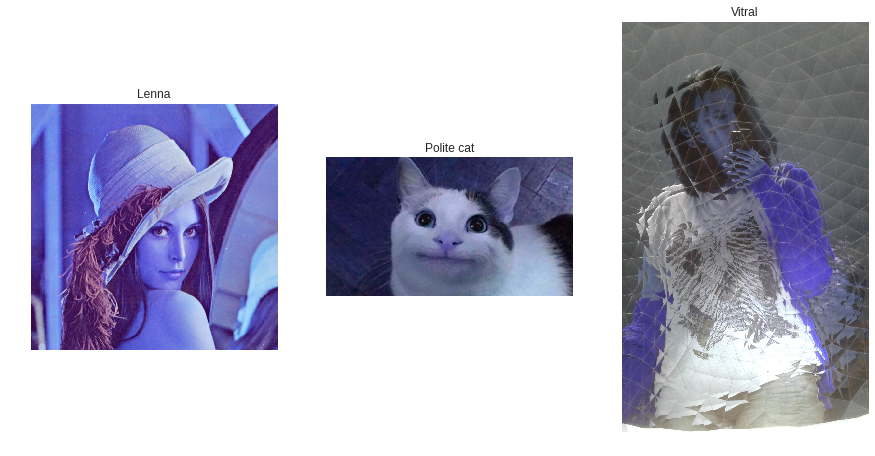

In [0]:
url = 'https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png'
response = requests.get(url)
image = np.asarray(bytearray(response.content), dtype="uint8")
img1 = cv2.imdecode(image, cv2.IMREAD_COLOR)

url = 'https://i.kym-cdn.com/entries/icons/original/000/026/638/cat.jpg'
response = requests.get(url)
image = np.asarray(bytearray(response.content), dtype="uint8")
img2 = cv2.imdecode(image, cv2.IMREAD_COLOR)

url = 'https://serving.photos.photobox.com/4633163125a3f63ea9fb7d7b216fff857559d25e79259a160a7668933d01d276c50e9193.jpg'
response = requests.get(url)
image = np.asarray(bytearray(response.content), dtype="uint8")
img3 = cv2.imdecode(image, cv2.IMREAD_COLOR)

plt.figure(figsize=(15,12))
plt.subplot(131), plt.imshow(img1)
plt.title('Lenna'), plt.axis('off')

plt.subplot(132), plt.imshow(img2)
plt.title('Polite cat'), plt.axis('off')

plt.subplot(133), plt.imshow(img3)
plt.title('Vitral'), plt.axis('off')

As imagens foram escolhidas para atender os critérios estabelecidos no previamente para os experimentos. As referências das imagens estão no final do relatório.

### Polite Cat

Para essa imagem, iniciamos com uma hipótese de que uma boa ordem das etapas seria a seguinte:

    Contorno > Passa baixa > Esqueletização
    
A ideia dessa ordem era detectar o contorno com sobel com `threshold` alto. Em seguida, com o filtro passa baixa suavizar as falhas do contorno, usando o efeito blur e, possivelmente, conctando pixels.  Por último realizar a esqueletização e "afinar" todo o contorno obtido até então.

Não seria utilizada a transformada de Hough, já que não existe nenhum contorno reto que seja de interesse na imagem.

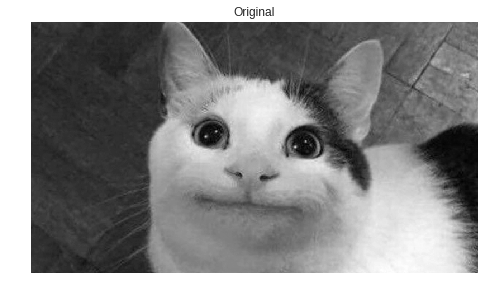

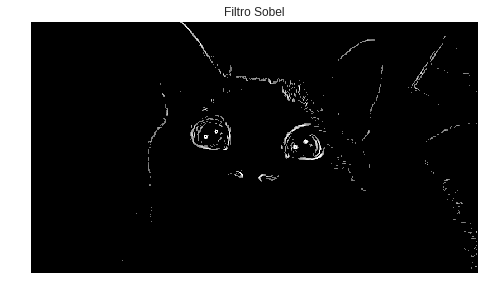

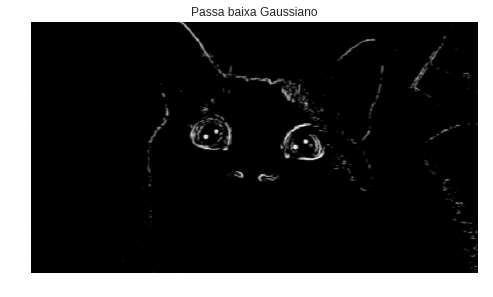

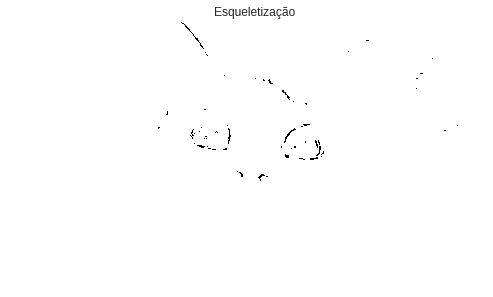

0

In [0]:
url = 'https://i.kym-cdn.com/entries/icons/original/000/026/638/cat.jpg'
response = requests.get(url)
image = np.asarray(bytearray(response.content), dtype="uint8")
img = cv2.imdecode(image, cv2.IMREAD_GRAYSCALE)

borda = sobel(img, 110)

fourier = filtrar_frequencias(borda, filter_function=low_gpf, D0=0.2)

se = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5))
skel = esqueletizacao(fourier, se)

plt.figure(figsize=(8,8)), plt.imshow(img, cmap='gray'),plt.title('Original'), plt.axis('off'), plt.grid(False), plt.show()
 
plt.figure(figsize=(8,8)),plt.imshow(borda, cmap='gray'),plt.title('Filtro Sobel'), plt.axis('off'), plt.grid(False), plt.show()

plt.figure(figsize=(8,8)), plt.imshow(fourier, cmap='gray'), plt.title('Passa baixa Gaussiano'), plt.axis('off'), plt.grid(False), plt.show()

plt.figure(figsize=(8,8)), plt.imshow(skel), plt.axis('off'), plt.title('Esqueletização'), plt.grid(False), plt.show()
0

Porém, essa abordagem não foi nem perto do que pode ser chamado de bom. Na verdade, o filtro sobel com `threshold` alto obteve um contorno muito ruim, com pouca informação. O passa baixa conseguiu conectar alguns pixels, mas como o contorno já estava comprometido, não ajudou muito. Na etapa ad esqueletização, como o contorno estava bastante desigual, com áreas bem finas e outras mais grossas, a esqueletização apagou todos os contornos finos e tirou muitíssimo da informação restante. 

Depois disso, realizamos diversos testes e conseguimos chegar a uma nova ordem de etapas e com parâmentos mais ajustados à imagem:

    Passa baixa > Contorno > Passa Baixa > Closing
    
Essa abordagem foi muitísimo melhor, preservando grande parte do contorno do gato. O passa baixa inicial ajudou a retirar um pouco do ruído dos pelos do gato, melhorando o resultado do Sobel, que foi utilizado com o `threshold = 30`, o obtido no trabalho 1. O segundo passa baixa ajudou a suavizar o contorno obtido e a etapa de Closing ajudou a melhorar a qualidade do contorno em áreas que estavam não tão finas.

Durante os testes foi utilizada a transformada de Hough, mas não mostrou resultados interessantes. Por conta disso ela foi eliminada.

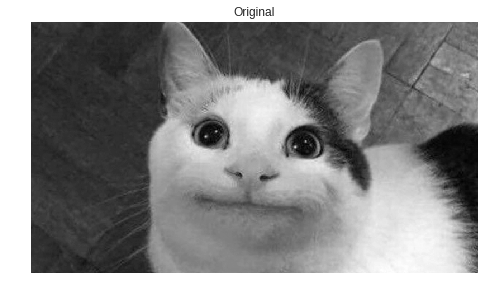

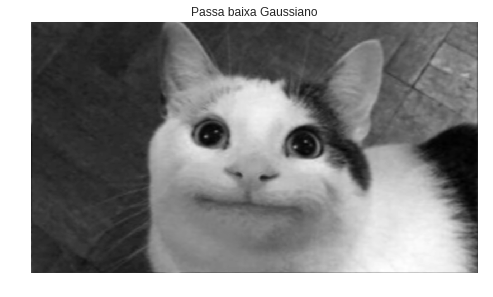

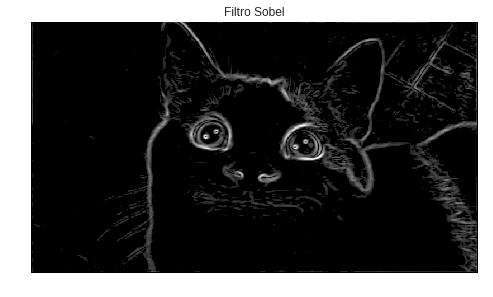

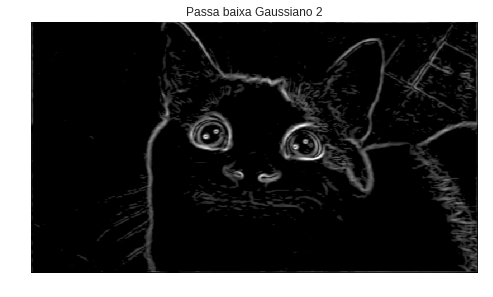

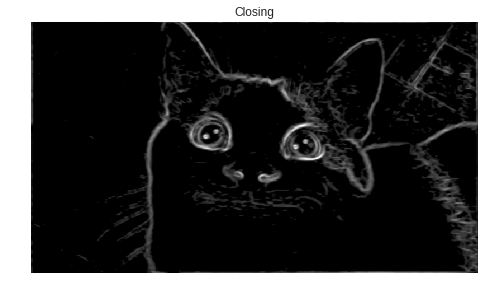

0

In [0]:
#@title
url = 'https://i.kym-cdn.com/entries/icons/original/000/026/638/cat.jpg'
response = requests.get(url)
image = np.asarray(bytearray(response.content), dtype="uint8")
img = cv2.imdecode(image, cv2.IMREAD_GRAYSCALE)

fourier = filtrar_frequencias(img, filter_function=low_gpf, D0=0.15)
borda = sobel(fourier, 30)

fourier2 = filtrar_frequencias(borda, filter_function=low_gpf, D0=0.3)

kernel = np.ones((3,3),np.uint8)
closed_edges_lines = cv2.morphologyEx(fourier2, cv2.MORPH_CLOSE, kernel)


plt.figure(figsize=(8,8)), plt.imshow(img, cmap='gray'), plt.title('Original'), plt.axis('off'), plt.grid(False), plt.show()

plt.figure(figsize=(8,8)), plt.imshow(fourier, cmap='gray'), plt.title('Passa baixa Gaussiano'), plt.axis('off'), plt.grid(False), plt.show()

plt.figure(figsize=(8,8)),plt.imshow(borda, cmap='gray'), plt.title('Filtro Sobel'), plt.axis('off'), plt.grid(False), plt.show()

plt.figure(figsize=(8,8)), plt.imshow(fourier2, cmap='gray'), plt.axis('off'), plt.title('Passa baixa Gaussiano 2'), plt.grid(False), plt.show()

plt.figure(figsize=(8,8)), plt.imshow(closed_edges_lines, cmap='gray'), plt.title('Closing'), plt.axis('off'), plt.grid(False), plt.show()
0

### Lenna

No caso da imagem de Lenna, testamos diversas combinações de filtro, fourier e transformações morfológicas, mas nenhuma preservava os aspectos importantes da imagem (contorno da Lenna) de maneira satisfatória.

A transformada de Hough novamnete não foi utilizada. Acreditamos que como essa imagem possui muito pouco contorno reto por se tratar de um rosto, as linhas de hough apenas causaram "ruído" na imagem.

Depois de muitos testes, chegamos a conclusão que o melhor era:

        Passa baixa > Contorno
        
Esse foi o conjunto de técnicas que melhor manteve todos os pontos importantes da imagem. O passa baixa suavizou a imagem, que não pssui uma qualidade muito alta, por ser antiga. Em seguiad o filtro de contorno obteve um resultado satisfatório.

Ao testar os dois filtros, Sobel e Robert, achamos os dois com bons resultados, mas preferimos o Robert por obter um contorno mais suave que o Sobel. Testamos também o filtro laplaciano, porém ele gerou muito ruído na imagem.

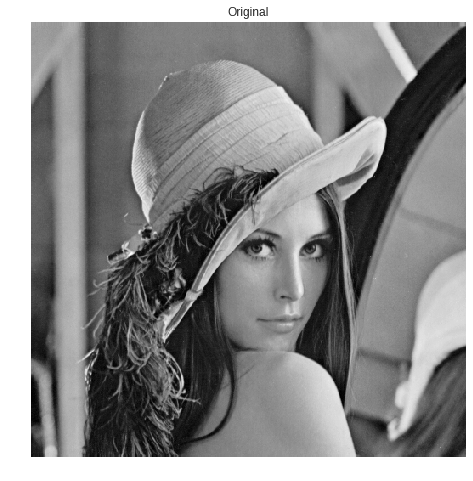

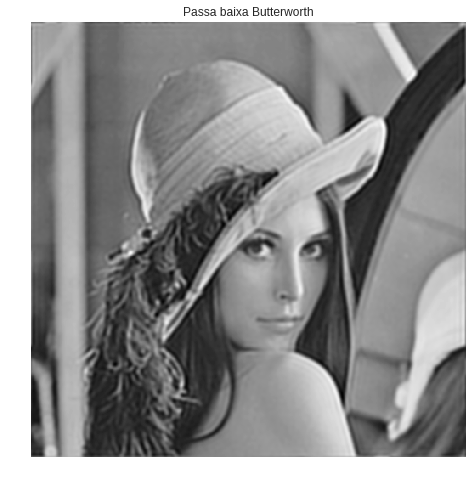

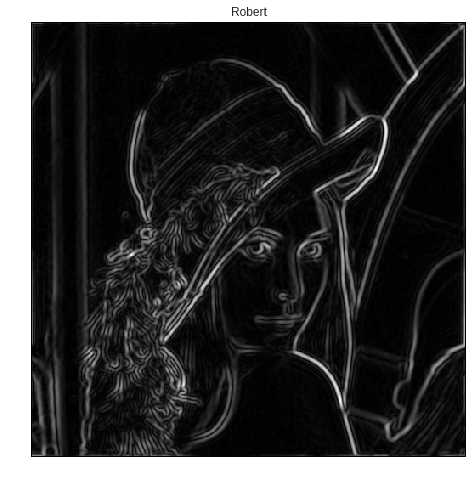

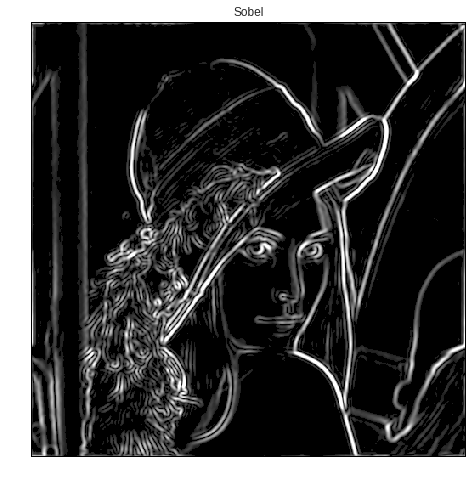

0

In [0]:
#@title
url = 'https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png'
response = requests.get(url)
image = np.asarray(bytearray(response.content), dtype="uint8")
img = cv2.imdecode(image, cv2.IMREAD_GRAYSCALE)

fourier = filtrar_frequencias(img, filter_function=low_bpf, D0=0.15, n=8)

borda1 = robert(fourier, True)

borda2 = sobel(fourier, 30)

plt.figure(figsize=(8,8)), plt.imshow(img, cmap='gray'), plt.title('Original'), plt.axis('off'), plt.grid(False), plt.show()

plt.figure(figsize=(8,8)), plt.imshow(fourier, cmap='gray'), plt.title('Passa baixa Butterworth'), plt.axis('off'), plt.grid(False), plt.show()

plt.figure(figsize=(8,8)),plt.imshow(borda1, cmap='gray'), plt.title('Robert'), plt.axis('off'), plt.grid(False), plt.show()

plt.figure(figsize=(8,8)),plt.imshow(borda2, cmap='gray'), plt.title('Sobel'), plt.axis('off'), plt.grid(False), plt.show()
0

### Vitral

Para a transformada de Hough utilizamos a imagem vitral para realizarmos nossos experimentos. Como a imagem apresenta uma quantidade expressiva de linhas supomos que a transformada iria ter uma boa performance no resultado. Porém utilizando o método e avaliando no decorrer dos testes percebemos que a imagem apresenta grande ruído e por isso quando ao final aplicamos a transformada percebemos que ela distorcia e aumentava bastante os ruídos. Aqui vai alguns exemplos de como a imagem ficou e também temos o melhor resultado:

    Contorno > Passa baixa (Gaussiano)

(Text(0.5,1,'Contorno com linhas (closed)'), (-0.5, 1535.5, 2559.5, -0.5))

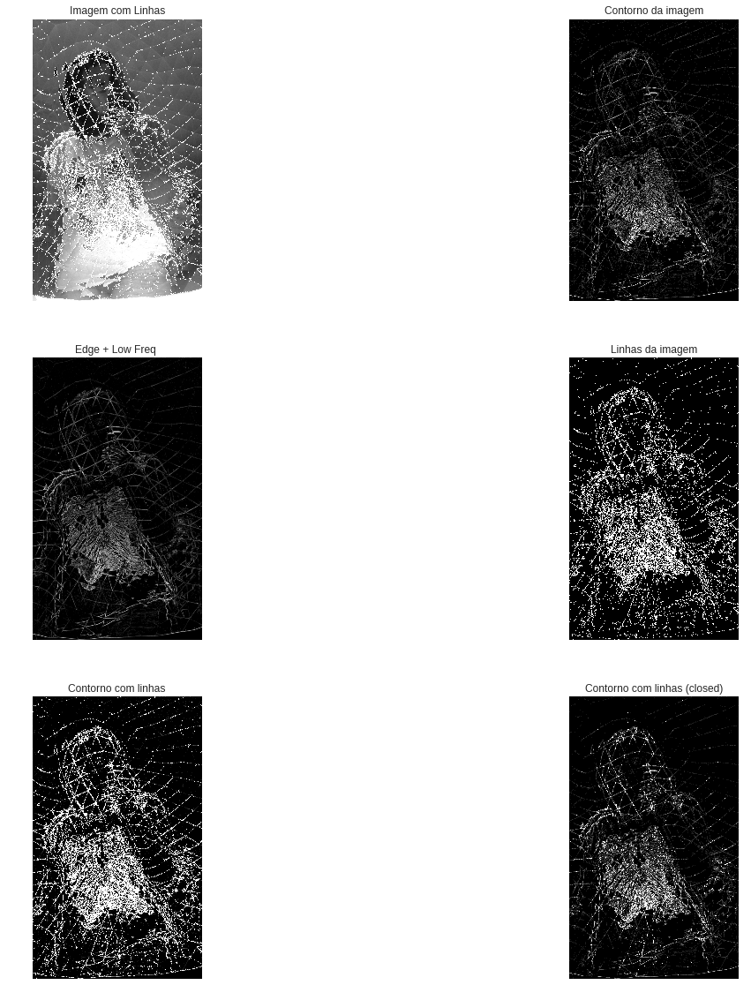

In [0]:
#url = 'https://http2.mlstatic.com/6-tabuleiros-de-xadrez-silicone-D_NQ_NP_817552-MLB25718246975_062017-F.jpg'
url = 'https://serving.photos.photobox.com/4633163125a3f63ea9fb7d7b216fff857559d25e79259a160a7668933d01d276c50e9193.jpg'
response = requests.get(url)
image = np.asarray(bytearray(response.content), dtype="uint8")
img = cv2.imdecode(image, cv2.IMREAD_GRAYSCALE)

minLineLength = 20
maxLineGap = 2

black_board = np.zeros_like(img)

kernel = np.ones((3,3),np.uint8)

# edges = cv2.Canny(img,20,100,apertureSize = 3)

edges = sobel(img,20)

rows, cols = img.shape
crow,ccol = int(rows/2) , int(cols/2)
edge_l_freq = filtrar_frequencias(edges, low_gpf, D0=crow*0.2)

cv2.imwrite("edge_low_freq.png", edge_l_freq)


edge_lines = np.copy(edges)

lines = probabilistic_hough_line(edges,threshold=10, line_length=5,line_gap=3)

for line in lines:
    p0,p1 = line
    cv2.line(img,(p0[0],p0[1]),(p1[0],p1[1]),(255,255,255),1)
    cv2.line(black_board,(p0[0],p0[1]),(p1[0],p1[1]),(255,255,255),1)
    cv2.line(edge_lines,(p0[0],p0[1]),(p1[0],p1[1]),(255,255,255),1)
    

plt.figure().suptitle('Imagem com Linhas', fontsize=16)

cv2.imwrite("edges.png",edges)

cv2.imwrite("edges_lines.png",edge_lines)

closed_edges_lines = cv2.morphologyEx(edge_lines, cv2.MORPH_OPEN, kernel)
cv2.imwrite("closed_edges_lines.png",closed_edges_lines)

img2 = closed_edges_lines

rows, cols = img.shape
crow,ccol = int(rows/2) , int(cols/2)
f_image = filtrar_frequencias(img2, low_gpf, D0=crow*0.2)

cv2.imwrite("pimg_back.png", f_image)

plt.figure(figsize=(20,20))

plt.subplot(321), plt.imshow(img,cmap = 'gray')
plt.title('Imagem com Linhas'), plt.axis('off')

plt.subplot(322), plt.imshow(edges,cmap = 'gray')
plt.title('Contorno da imagem'), plt.axis('off')

plt.subplot(323), plt.imshow(edge_l_freq,cmap = 'gray')
plt.title('Edge + Low Freq '), plt.axis('off')

plt.subplot(324), plt.imshow(black_board,cmap = 'gray')
plt.title('Linhas da imagem'), plt.axis('off')

plt.subplot(325), plt.imshow(edge_lines,cmap = 'gray')
plt.title('Contorno com linhas'), plt.axis('off')

plt.subplot(326), plt.imshow(closed_edges_lines,cmap = 'gray')
plt.title('Contorno com linhas (closed)'), plt.axis('off')
0

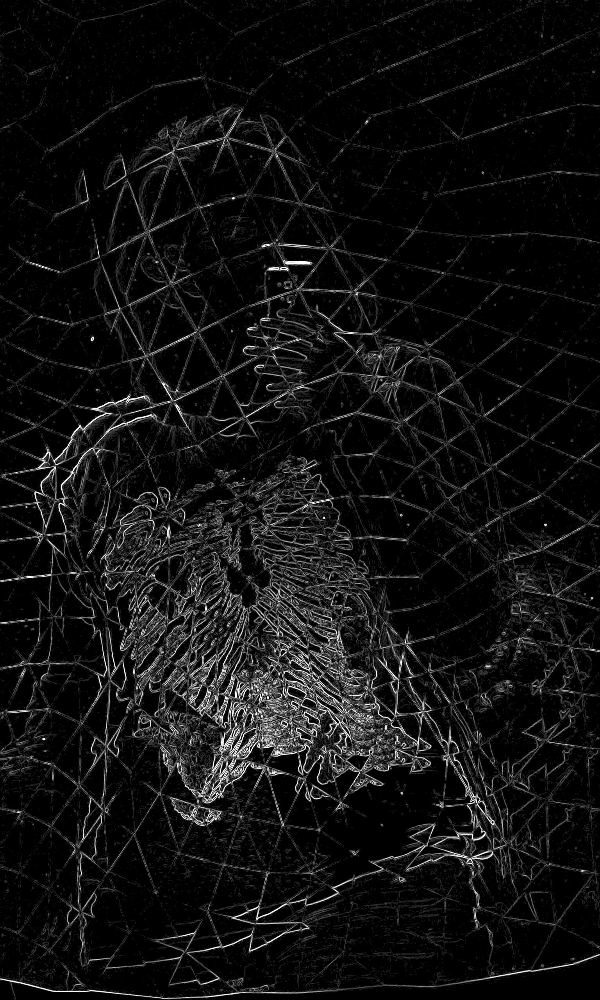

In [0]:
from IPython.display import Image
Image('edges.png', width=700, height=1000 )

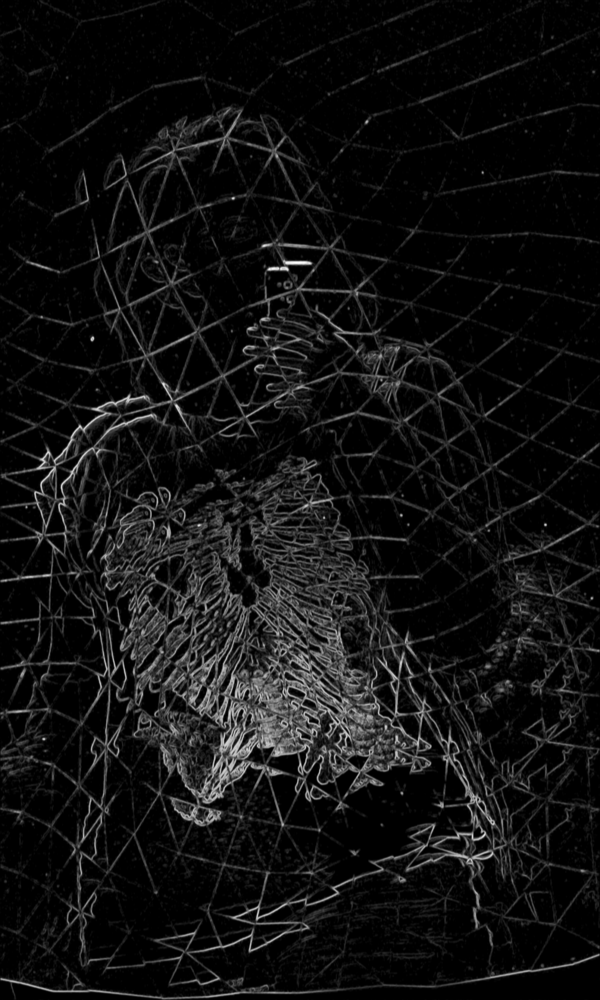

In [0]:
from IPython.display import Image
Image('edge_low_freq.png', width=700, height=1000 )

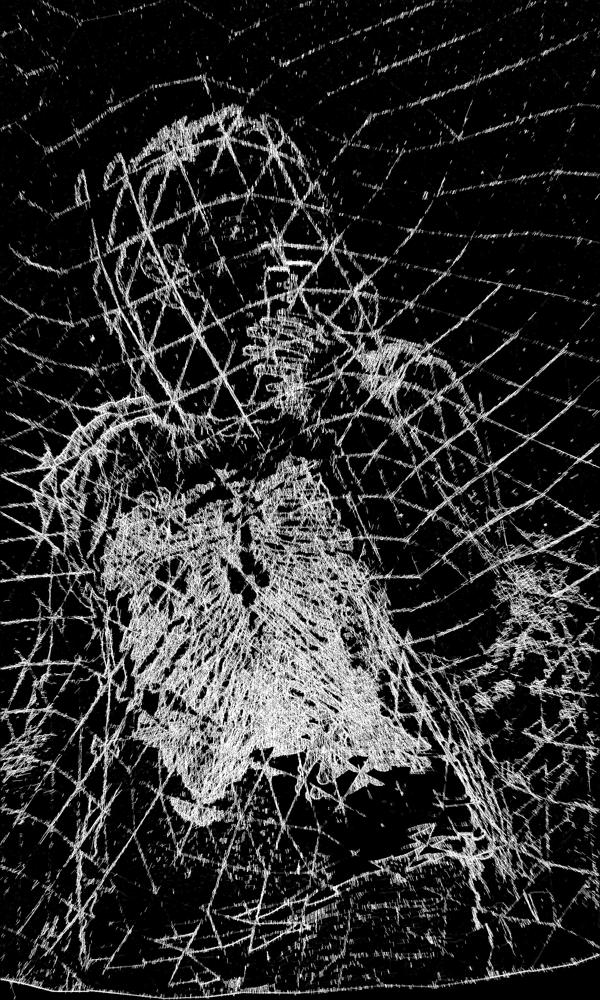

In [0]:
from IPython.display import Image
Image('edges_lines.png', width=700, height=1000 )

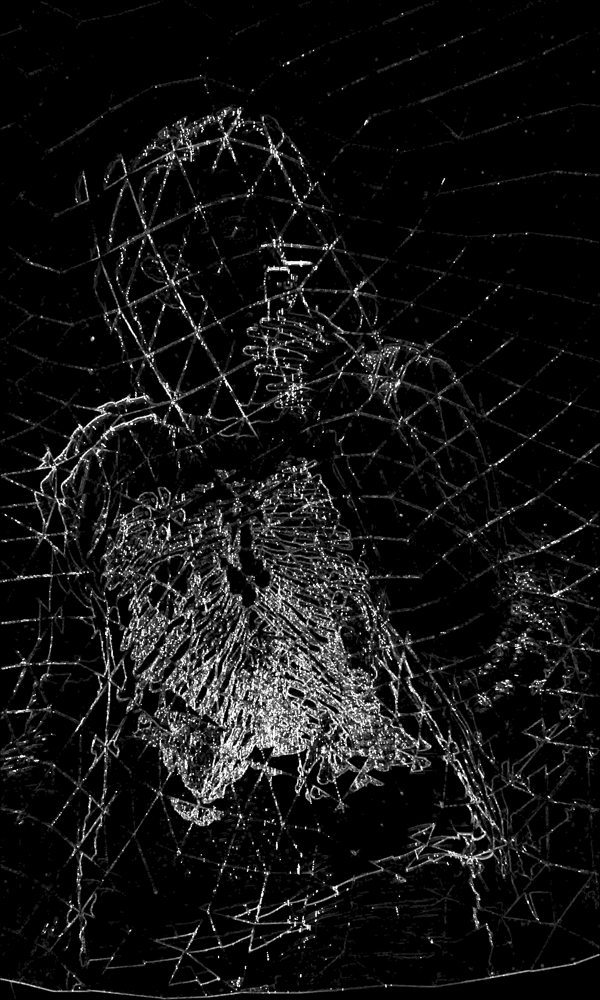

In [0]:
from IPython.display import Image
Image('closed_edges_lines.png', width=700, height=1000 )

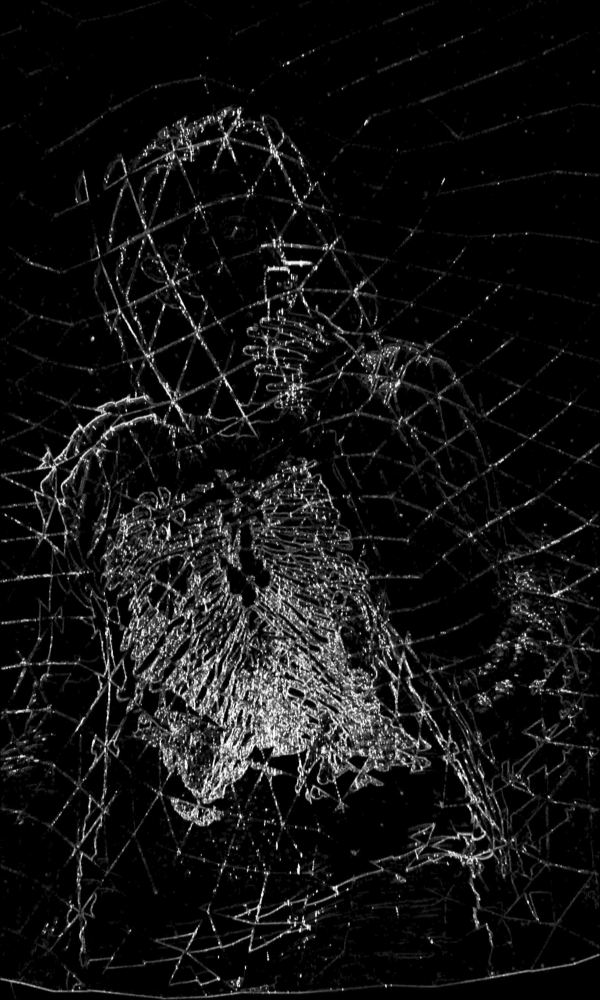

In [0]:
from IPython.display import Image
Image('pimg_back.png', width=700, height=1000 )

## Referências

Imagem de mulher (Lenna):
disponível em: <https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png>, acesso em 21 out. 2018

Imagem do Gato (Polite Cat)
disponível em: <https://i.kym-cdn.com/entries/icons/original/000/026/638/cat.jpg>, acesso em 11 dez. 2018

Imagem do Vitral:
disponível em: <https://serving.photos.photobox.com/4633163125a3f63ea9fb7d7b216fff857559d25e79259a160a7668933d01d276c50e9193.jpg>, acesso em 12 dez. 2018